In [1]:
import aiapy
import astropy
import astropy.time
import astropy.units as u
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import sunpy
import sunpy.map
# from aiapy.calibrate import (
#     correct_degradation,
#     degradation,
#     estimate_error,
#     fetch_spikes,
#     normalize_exposure,
#     register,
#     respike,
#     update_pointing,
# )
from aiapy.calibrate.util import get_correction_table
from aiapy.psf import deconvolve, psf
from aiapy.response import Channel
from astropy.coordinates import SkyCoord
from astropy.visualization import ImageNormalize, LogStretch, time_support
from sunpy.net import Fido
from sunpy.net import attrs as a
from sunpy.time import parse_time

# Increases the figure size in this notebook.
mpl.rcParams["savefig.dpi"] = 400
mpl.rcParams["figure.dpi"] = 400

In [17]:
t_start = parse_time("2024-08-11T20:00:00")
search_results = Fido.search(
    a.Time(t_start, t_start + 120 * u.s),
    a.Instrument.hmi,
)
search_results

Start Time,End Time,Source,Instrument,Wavelength,Provider,Physobs,Wavetype,Extent Width,Extent Length,Extent Type,Size
,,,,Angstrom,,,,,,,Mibyte
Time,Time,str3,str3,float64[2],str4,str18,str6,str4,str4,str8,float64
2024-08-11 20:00:37.000,2024-08-11 20:00:38.000,SDO,HMI,6173.0 .. 6174.0,JSOC,intensity,NARROW,4096,4096,FULLDISK,-0.00098
2024-08-11 20:00:37.000,2024-08-11 20:00:38.000,SDO,HMI,6173.0 .. 6174.0,JSOC,LOS_magnetic_field,NARROW,4096,4096,FULLDISK,-0.00098
2024-08-11 20:00:37.000,2024-08-11 20:00:38.000,SDO,HMI,6173.0 .. 6174.0,JSOC,LOS_velocity,NARROW,4096,4096,FULLDISK,-0.00098
2024-08-11 20:01:22.000,2024-08-11 20:01:23.000,SDO,HMI,6173.0 .. 6174.0,JSOC,intensity,NARROW,4096,4096,FULLDISK,-0.00098
2024-08-11 20:01:22.000,2024-08-11 20:01:23.000,SDO,HMI,6173.0 .. 6174.0,JSOC,LOS_magnetic_field,NARROW,4096,4096,FULLDISK,-0.00098
2024-08-11 20:01:22.000,2024-08-11 20:01:23.000,SDO,HMI,6173.0 .. 6174.0,JSOC,LOS_velocity,NARROW,4096,4096,FULLDISK,-0.00098


In [19]:
search_results

IndexError: list index out of range

In [21]:
files = Fido.fetch(search_results, max_conn=1)

Files Downloaded:   0%|          | 0/6 [00:00<?, ?file/s]

hmi.ic_45s.2024.08.11_20_02_15_TAI.continuum.fits:   0%|          | 0.00/15.2M [00:00<?, ?B/s]

hmi.m_45s.2024.08.11_20_01_30_TAI.magnetogram.fits:   0%|          | 0.00/16.2M [00:00<?, ?B/s]

hmi.m_45s.2024.08.11_20_02_15_TAI.magnetogram.fits:   0%|          | 0.00/16.2M [00:00<?, ?B/s]

hmi.v_45s.2024.08.11_20_02_15_TAI.Dopplergram.fits:   0%|          | 0.00/17.7M [00:00<?, ?B/s]

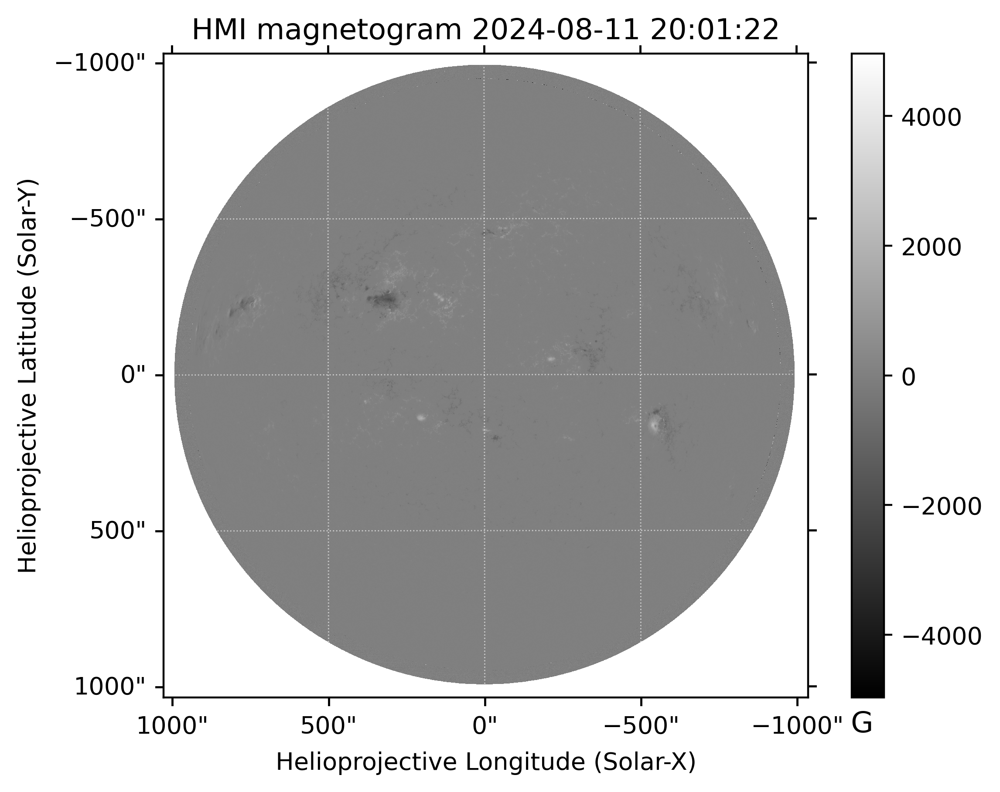

In [41]:
m_hmi.peek()

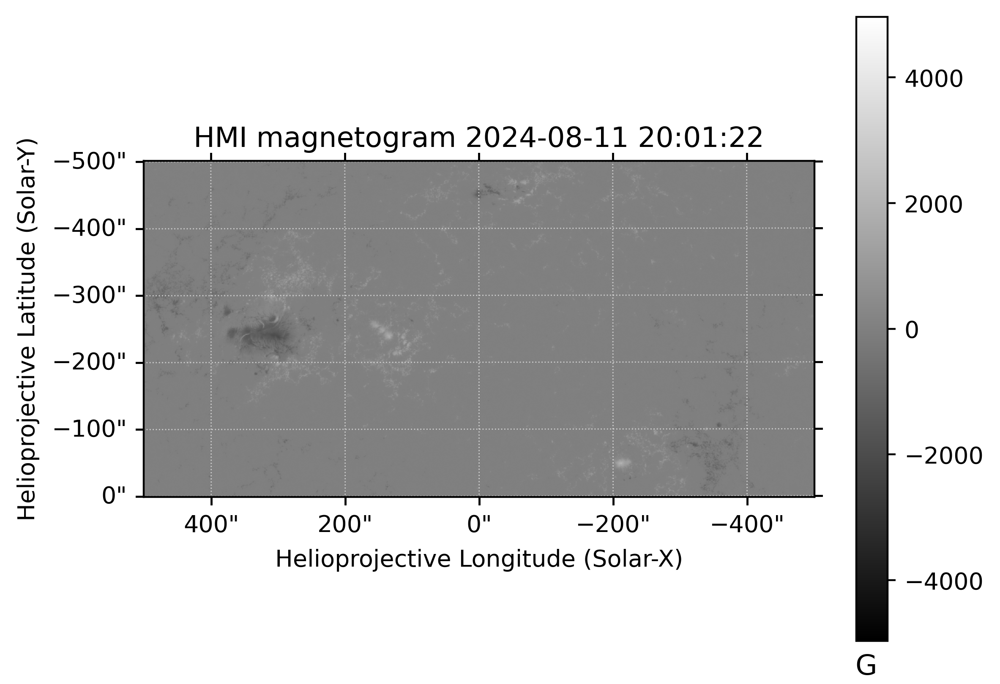

In [39]:
m_hmi = sunpy.map.Map(files[3])
blc = SkyCoord(-500, -500, unit="arcsec", frame=m_hmi.coordinate_frame)
fov = {"width": 1000 * u.arcsec, "height": 500 * u.arcsec}
m_hmi_cutout = m_hmi.submap(blc, **fov)
m_hmi_cutout.peek()

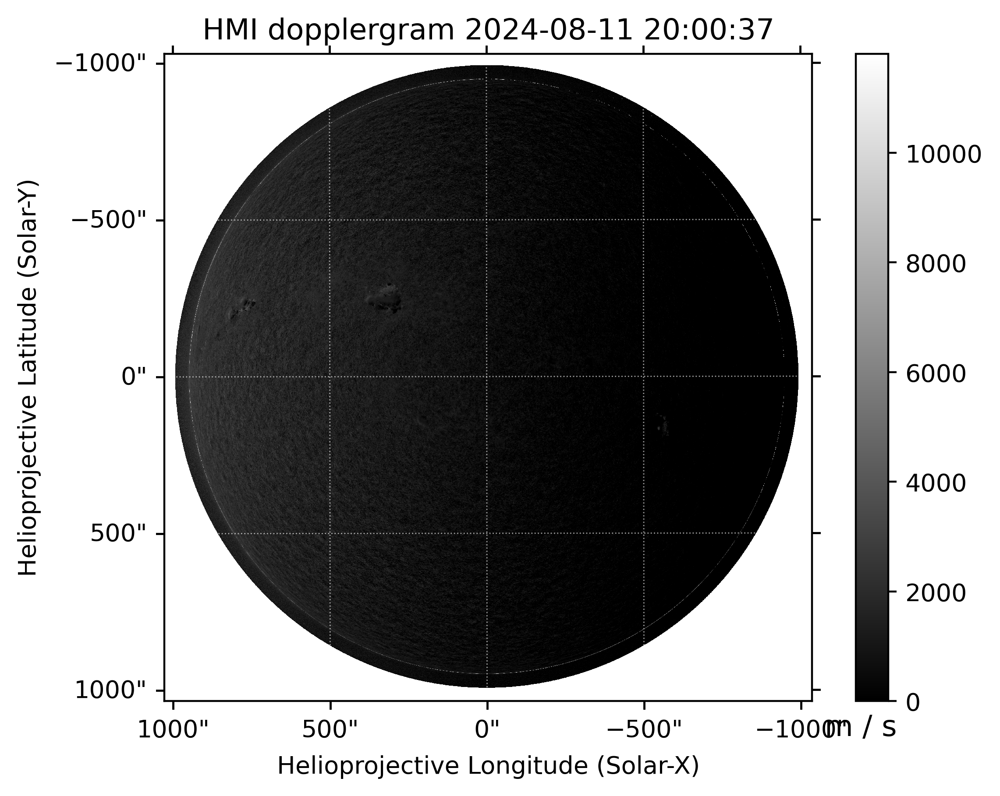

In [13]:
m_hmi.peek(vmin=0)

In [22]:
t_start = parse_time("2024-08-08T19:30:00")
search_results = Fido.search(
    a.Time(t_start, t_start + 24 * u.s),
    a.Instrument.aia,
    a.Wavelength(171 * u.angstrom) | a.Wavelength(1600 * u.angstrom)| a.Wavelength(304 * u.angstrom),
)
search_results

Start Time,End Time,Source,Instrument,Wavelength,Provider,Physobs,Wavetype,Extent Width,Extent Length,Extent Type,Size
,,,,Angstrom,,,,,,,Mibyte
Time,Time,str3,str3,float64[2],str4,str9,str6,str4,str4,str8,float64
2024-08-08 19:30:09.000,2024-08-08 19:30:10.000,SDO,AIA,171.0 .. 171.0,JSOC,intensity,NARROW,4096,4096,FULLDISK,64.64844
2024-08-08 19:30:21.000,2024-08-08 19:30:22.000,SDO,AIA,171.0 .. 171.0,JSOC,intensity,NARROW,4096,4096,FULLDISK,64.64844
Start Time,End Time,Source,Instrument,Wavelength,Provider,Physobs,Wavetype,Extent Width,Extent Length,Extent Type,Size
,,,,Angstrom,,,,,,,Mibyte
Time,Time,str3,str3,float64[2],str4,str9,str6,str4,str4,str8,float64
2024-08-08 19:30:14.000,2024-08-08 19:30:15.000,SDO,AIA,1600.0 .. 1600.0,JSOC,intensity,NARROW,4096,4096,FULLDISK,64.64844
Start Time,End Time,Source,Instrument,Wavelength,Provider,Physobs,Wavetype,Extent Width,Extent Length,Extent Type,Size
,,,,Angstrom,,,,,,,Mibyte


In [23]:
files = Fido.fetch(search_results, max_conn=1)

Files Downloaded:   0%|          | 0/5 [00:00<?, ?file/s]

aia.lev1.171A_2024_08_08T19_30_21.35Z.image_lev1.fits:   0%|          | 0.00/12.3M [00:00<?, ?B/s]

5/0 files failed to download. Please check `.errors` for details


In [28]:
files

[]
Errors:
(<parfive.results.Error object at 0x31b9a2bd0>
https://sdo7.nascom.nasa.gov/cgi-bin/drms_export.cgi?series=aia__lev1;compress=rice;record=171_1502220647-1502220647,
Download Failed: https://sdo7.nascom.nasa.gov/cgi-bin/drms_export.cgi?series=aia__lev1;compress=rice;record=171_1502220647-1502220647 with error <ClientResponse(https://sdo7.nascom.nasa.gov/cgi-bin/drms_export.cgi?series=aia__lev1;compress=rice;record=171_1502220647-1502220647) [500 Internal Server Error]>
<CIMultiDictProxy('Date': 'Thu, 27 Mar 2025 14:28:19 GMT', 'Server': 'Apache', 'Strict-Transport-Security': 'max-age=31536000; includeSubDomains', 'Content-Length': '541', 'Connection': 'close', 'Content-Type': 'text/html; charset=iso-8859-1')>
)(<parfive.results.Error object at 0x31b9a1c10>
https://sdo7.nascom.nasa.gov/cgi-bin/drms_export.cgi?series=aia__lev1;compress=rice;record=171_1502220659-1502220659,
Timeout on reading data from socket)(<parfive.results.Error object at 0x31b9a0530>
https://sdo7.nascom.na

In [30]:
m_171 = sunpy.map.Map(files[0])

IndexError: list index out of range

In [ ]:
m_171.peek(vmin=0)

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

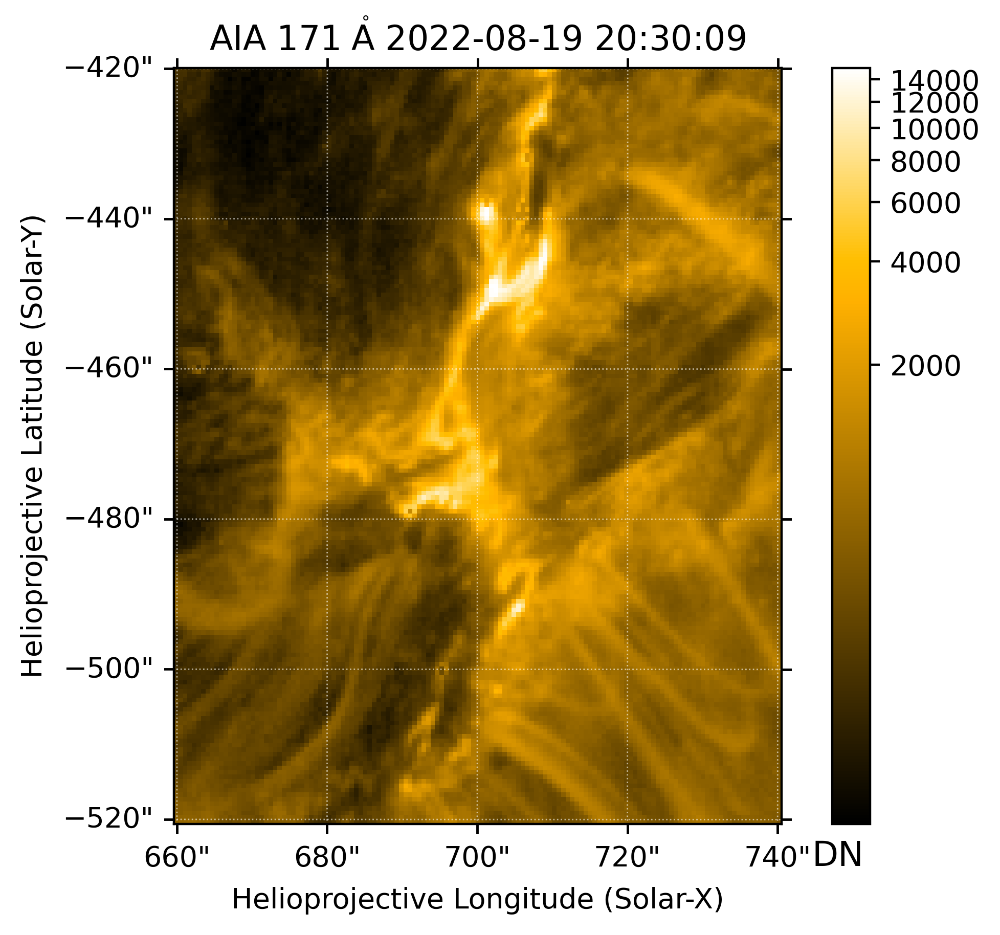

In [47]:
t_start = parse_time("2022-08-19T20:30:00")
search_results = Fido.search(
    a.Time(t_start, t_start + 12 * u.s),
    a.Instrument.aia,
    a.Wavelength(171 * u.angstrom) | a.Wavelength(1600 * u.angstrom),
)
files = Fido.fetch(search_results, max_conn=1)
m_171 = sunpy.map.Map(files[0])
blc = SkyCoord(660, -520, unit="arcsec", frame=m_171.coordinate_frame)
fov = {"width": 80 * u.arcsec, "height": 100 * u.arcsec}
m_171_cutout = m_171.submap(blc, **fov)
m_171_cutout.peek()

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

aia.lev1.131A_2022_08_19T20_30_10.12Z.image_lev1.fits:   0%|          | 0.00/7.15M [00:00<?, ?B/s]

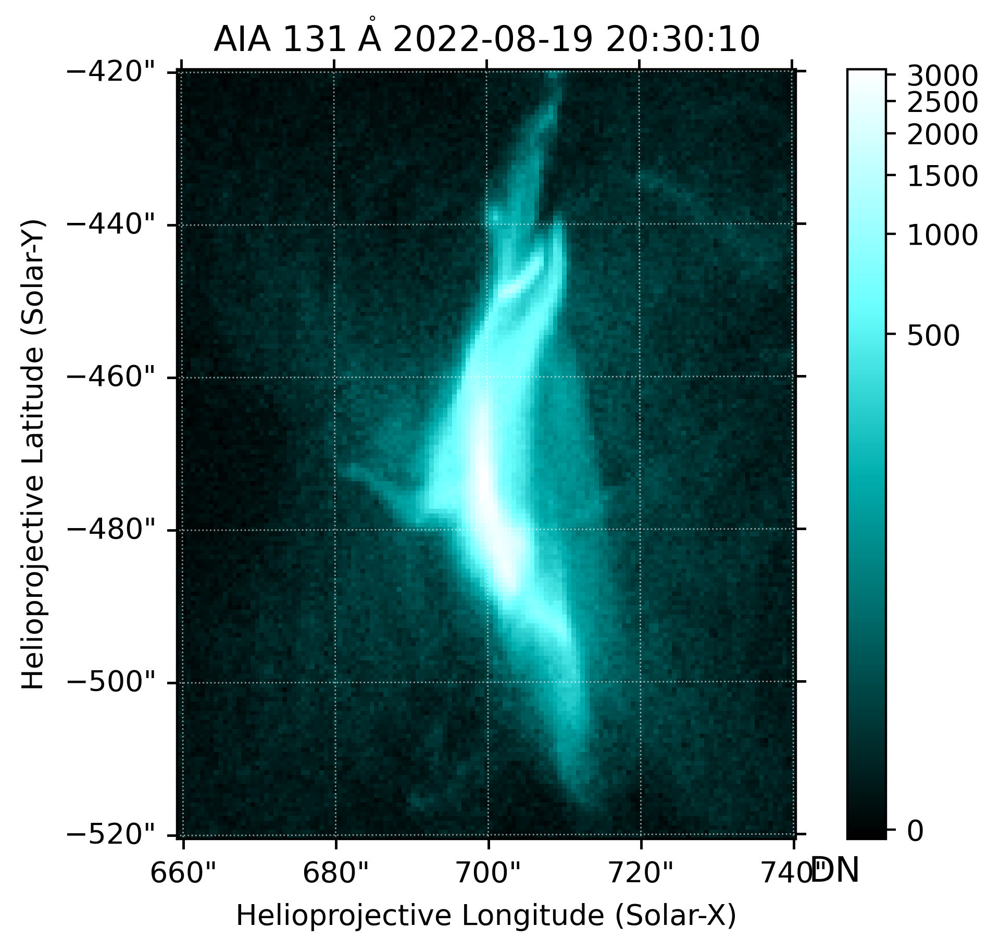

In [65]:
t_start = parse_time("2022-08-19T20:30:00")
search_results = Fido.search(
    a.Time(t_start, t_start + 12 * u.s),
    a.Instrument.aia,
    a.Wavelength(131 * u.angstrom),
)
files = Fido.fetch(search_results, max_conn=1)
m_131 = sunpy.map.Map(files[0])
blc = SkyCoord(660, -520, unit="arcsec", frame=m_131.coordinate_frame)
fov = {"width": 80 * u.arcsec, "height": 100 * u.arcsec}
m_131_cutout = m_131.submap(blc, **fov)
m_131_cutout.peek()

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

aia.lev1.1600A_2022_08_19T20_30_14.13Z.image_lev1.fits:   0%|          | 0.00/8.63M [00:00<?, ?B/s]

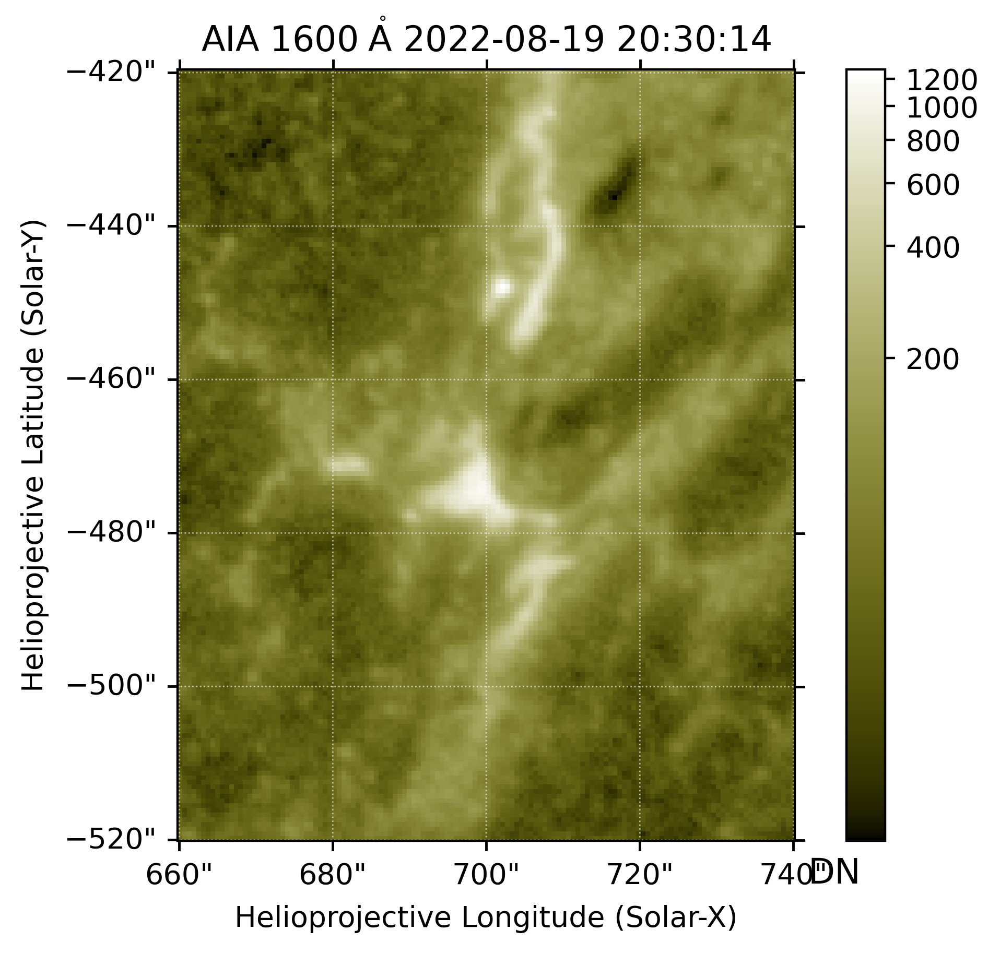

In [75]:
t_start = parse_time("2022-08-19T20:30:00")
search_results = Fido.search(
    a.Time(t_start, t_start + 30 * u.s),
    a.Instrument.aia,
    a.Wavelength(1600 * u.angstrom),
)
files = Fido.fetch(search_results, max_conn=1)
m_1600 = sunpy.map.Map(files[0])
blc = SkyCoord(660, -520, unit="arcsec", frame=m_1600.coordinate_frame)
fov = {"width": 80 * u.arcsec, "height": 100 * u.arcsec}
m_1600_cutout = m_1600.submap(blc, **fov)
m_1600_cutout.peek()

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

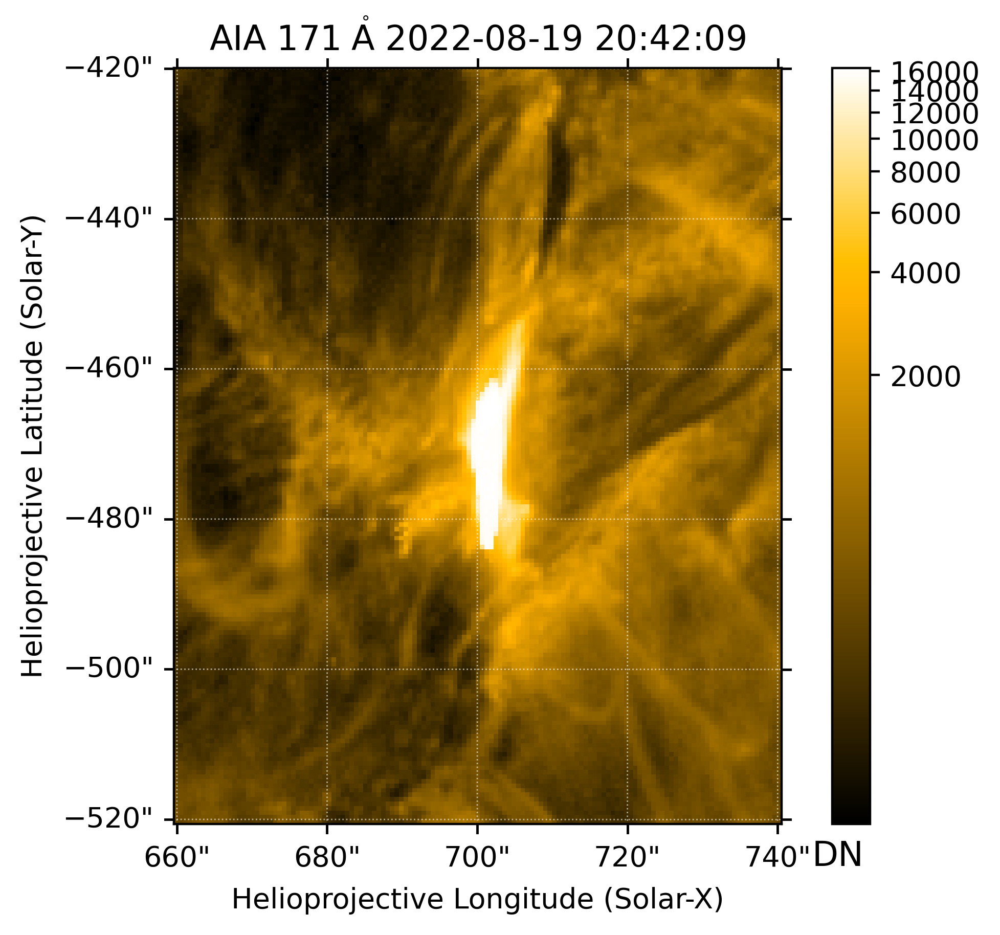

In [48]:
t_start = parse_time("2022-08-19T20:42:00")
search_results = Fido.search(
    a.Time(t_start, t_start + 12 * u.s),
    a.Instrument.aia,
    a.Wavelength(171 * u.angstrom) | a.Wavelength(1600 * u.angstrom),
)
files = Fido.fetch(search_results, max_conn=1)
m_171 = sunpy.map.Map(files[0])
blc = SkyCoord(660, -520, unit="arcsec", frame=m_171.coordinate_frame)
fov = {"width": 80 * u.arcsec, "height": 100 * u.arcsec}
m_171_cutout = m_171.submap(blc, **fov)
m_171_cutout.peek()

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

aia.lev1.131A_2022_08_19T20_42_06.62Z.image_lev1.fits:   0%|          | 0.00/8.29M [00:00<?, ?B/s]

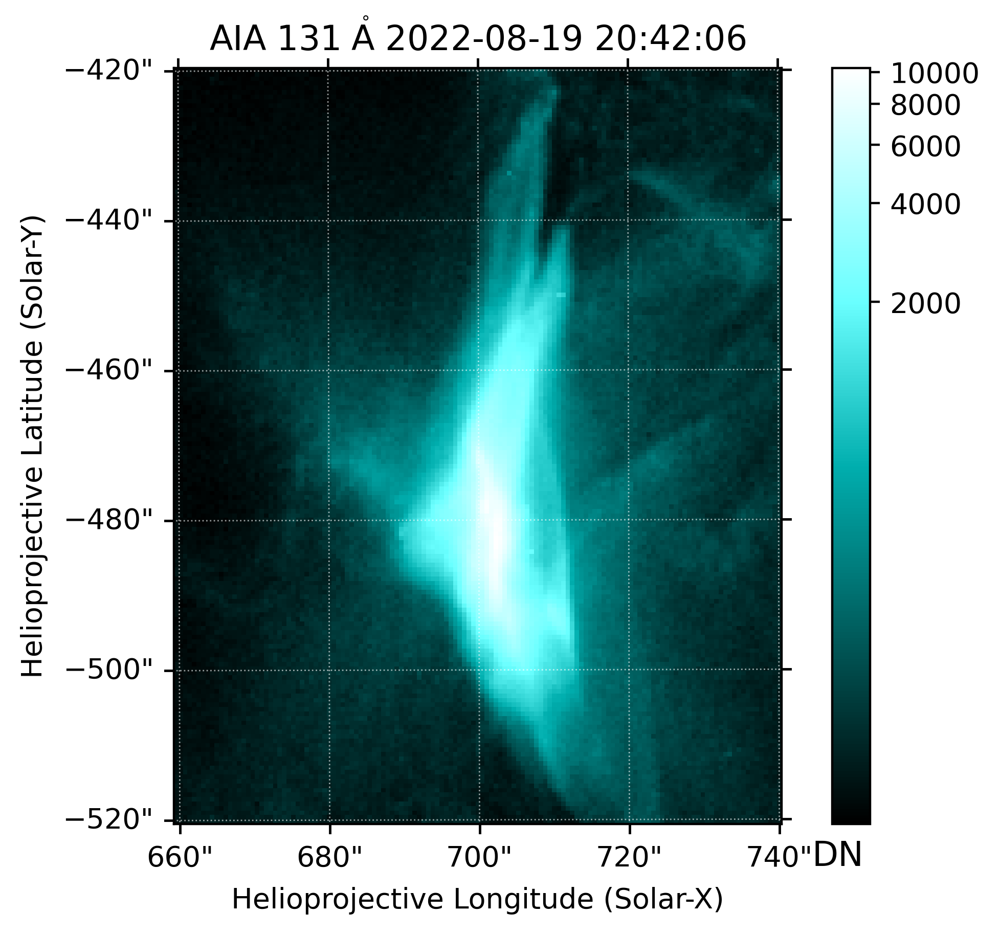

In [53]:
t_start = parse_time("2022-08-19T20:42:00")
search_results = Fido.search(
    a.Time(t_start, t_start + 12 * u.s),
    a.Instrument.aia,
    a.Wavelength(131 * u.angstrom),
)
files = Fido.fetch(search_results, max_conn=1)
m_131 = sunpy.map.Map(files[0])
blc = SkyCoord(660, -520, unit="arcsec", frame=m_131.coordinate_frame)
fov = {"width": 80 * u.arcsec, "height": 100 * u.arcsec}
m_131_cutout = m_171.submap(blc, **fov)
m_131_cutout.peek()

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

aia.lev1.1600A_2022_08_19T20_42_14.13Z.image_lev1.fits:   0%|          | 0.00/8.63M [00:00<?, ?B/s]

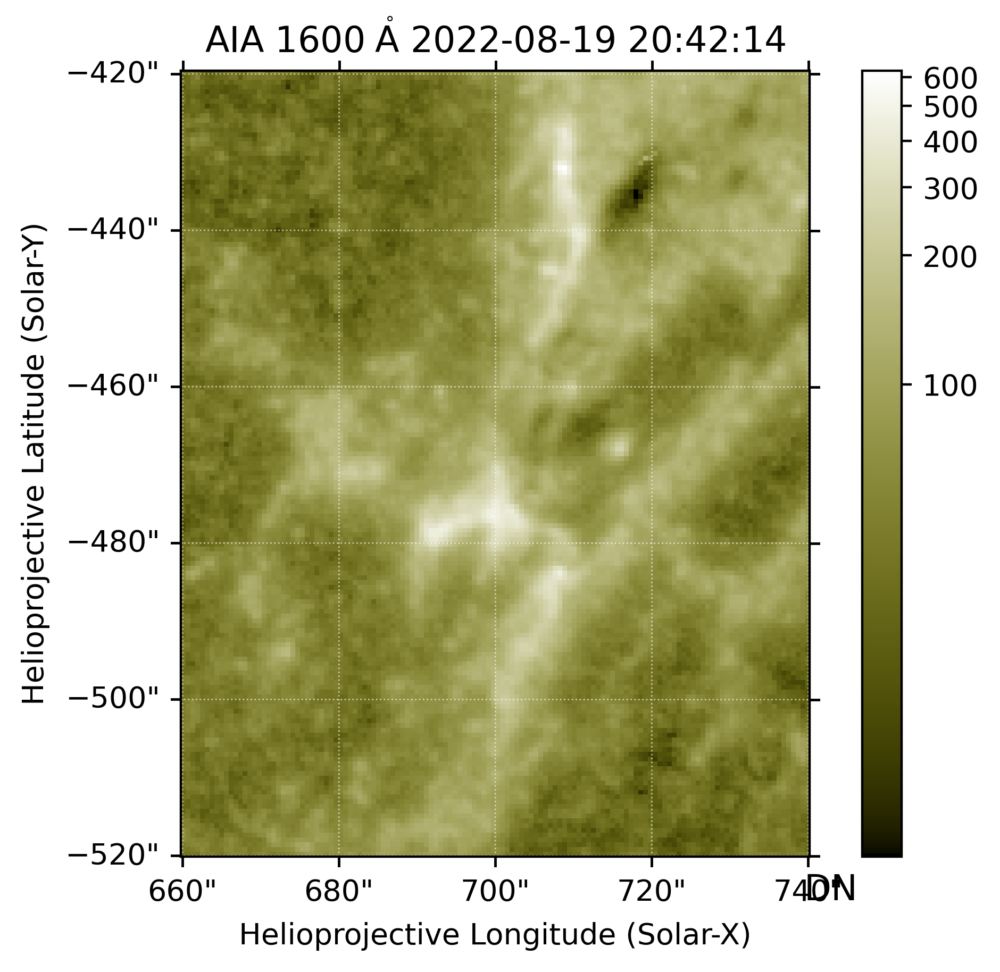

In [77]:
t_start = parse_time("2022-08-19T20:42:00")
search_results = Fido.search(
    a.Time(t_start, t_start + 30 * u.s),
    a.Instrument.aia,
    a.Wavelength(1600 * u.angstrom),
)
files = Fido.fetch(search_results, max_conn=1)
m_1600 = sunpy.map.Map(files[0])
blc = SkyCoord(660, -520, unit="arcsec", frame=m_1600.coordinate_frame)
fov = {"width": 80 * u.arcsec, "height": 100 * u.arcsec}
m_1600_cutout = m_1600.submap(blc, **fov)
m_1600_cutout.peek()

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

aia.lev1.171A_2022_08_19T20_55_09.35Z.image_lev1.fits:   0%|          | 0.00/11.7M [00:00<?, ?B/s]

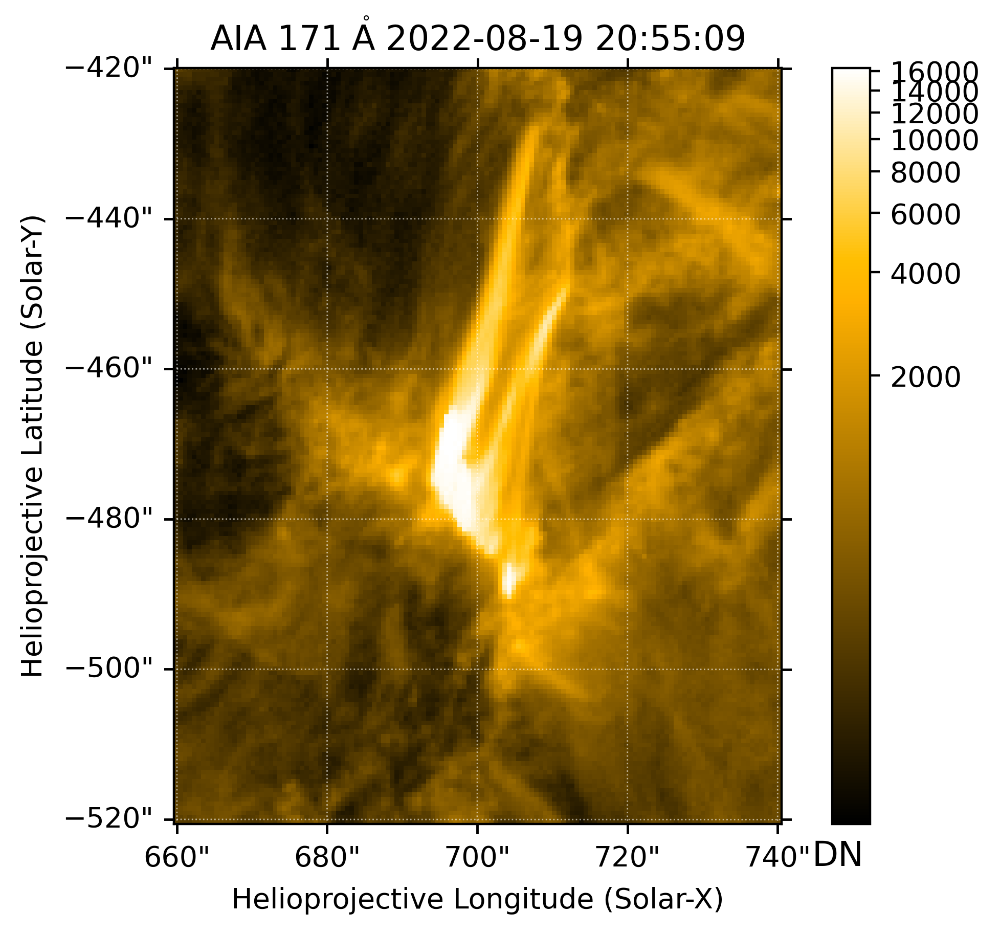

In [57]:
t_start = parse_time("2022-08-19T20:55:00")
search_results = Fido.search(
    a.Time(t_start, t_start + 12 * u.s),
    a.Instrument.aia,
    a.Wavelength(171 * u.angstrom),
)
files = Fido.fetch(search_results, max_conn=1)
m_171 = sunpy.map.Map(files[0])
blc = SkyCoord(660, -520, unit="arcsec", frame=m_171.coordinate_frame)
fov = {"width": 80 * u.arcsec, "height": 100 * u.arcsec}
m_171_cutout = m_171.submap(blc, **fov)
m_171_cutout.peek()

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

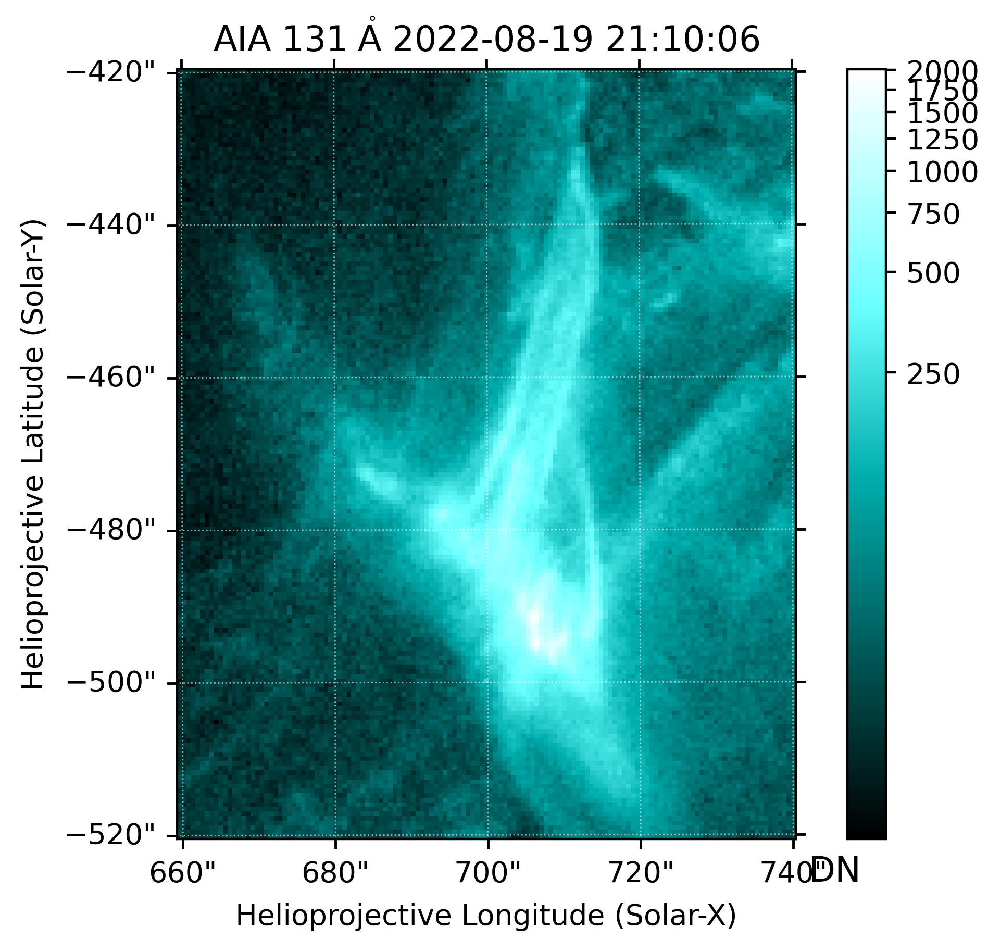

In [61]:
t_start = parse_time("2022-08-19T21:10:00")
search_results = Fido.search(
    a.Time(t_start, t_start + 12 * u.s),
    a.Instrument.aia,
    a.Wavelength(131 * u.angstrom),
)
files = Fido.fetch(search_results, max_conn=1)
m_131 = sunpy.map.Map(files[0])
blc = SkyCoord(660, -520, unit="arcsec", frame=m_131.coordinate_frame)
fov = {"width": 80 * u.arcsec, "height": 100 * u.arcsec}
m_131_cutout = m_131.submap(blc, **fov)
m_131_cutout.peek()

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

aia.lev1.1600A_2022_08_19T21_10_14.13Z.image_lev1.fits:   0%|          | 0.00/8.63M [00:00<?, ?B/s]

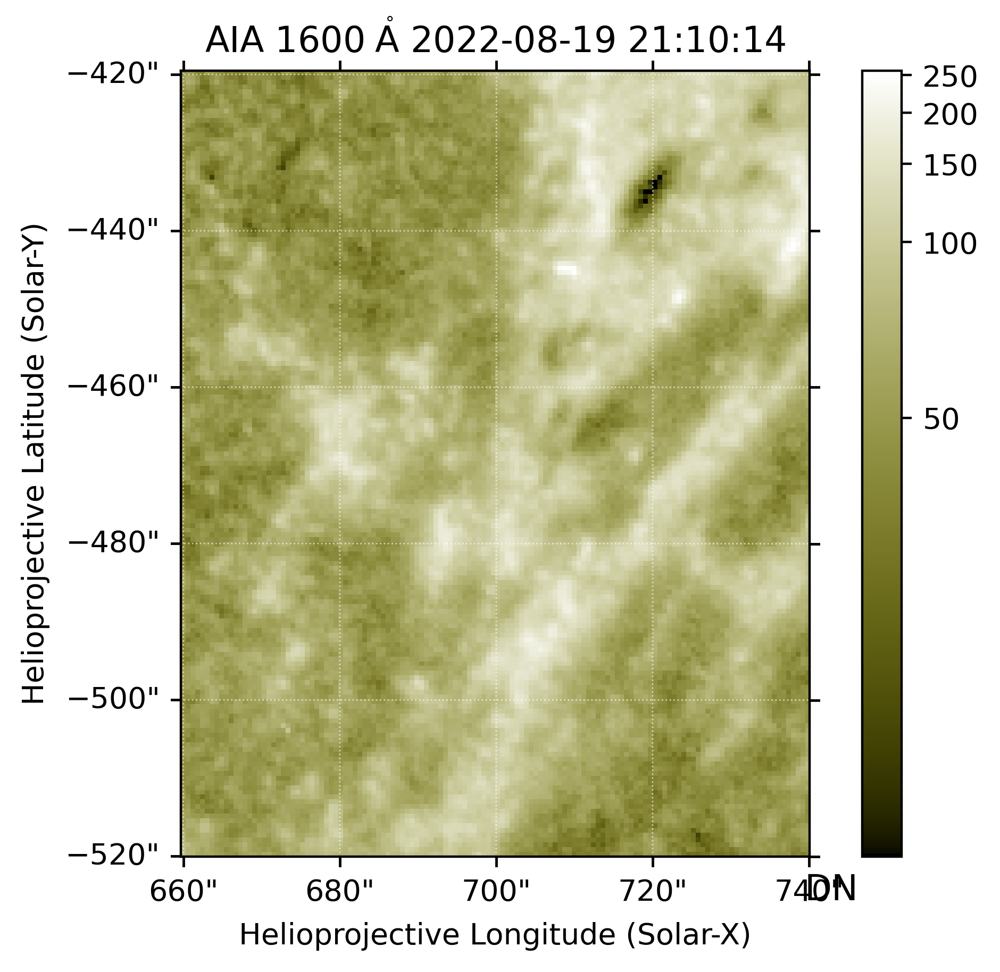

In [79]:
t_start = parse_time("2022-08-19T21:10:00")
search_results = Fido.search(
    a.Time(t_start, t_start + 30 * u.s),
    a.Instrument.aia,
    a.Wavelength(1600 * u.angstrom),
)
files = Fido.fetch(search_results, max_conn=1)
m_1600 = sunpy.map.Map(files[0])
blc = SkyCoord(660, -520, unit="arcsec", frame=m_1600.coordinate_frame)
fov = {"width": 80 * u.arcsec, "height": 100 * u.arcsec}
m_1600_cutout = m_1600.submap(blc, **fov)
m_1600_cutout.peek()

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

aia.lev1.171A_2022_08_19T21_10_09.35Z.image_lev1.fits:   0%|          | 0.00/11.7M [00:00<?, ?B/s]

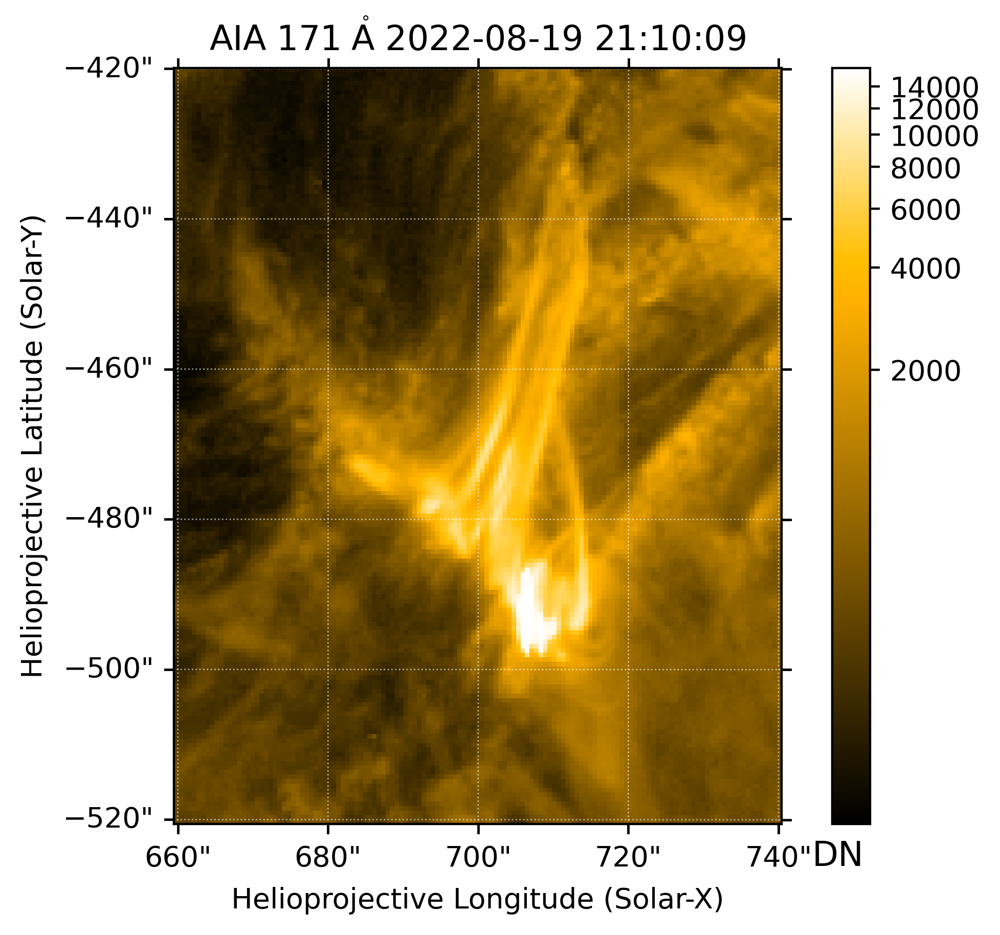

In [62]:
t_start = parse_time("2022-08-19T21:10:00")
search_results = Fido.search(
    a.Time(t_start, t_start + 12 * u.s),
    a.Instrument.aia,
    a.Wavelength(171 * u.angstrom),
)
files = Fido.fetch(search_results, max_conn=1)
m_171 = sunpy.map.Map(files[0])
blc = SkyCoord(660, -520, unit="arcsec", frame=m_171.coordinate_frame)
fov = {"width": 80 * u.arcsec, "height": 100 * u.arcsec}
m_171_cutout = m_171.submap(blc, **fov)
m_171_cutout.peek()

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

aia.lev1.131A_2022_08_19T21_30_06.63Z.image_lev1.fits:   0%|          | 0.00/8.27M [00:00<?, ?B/s]

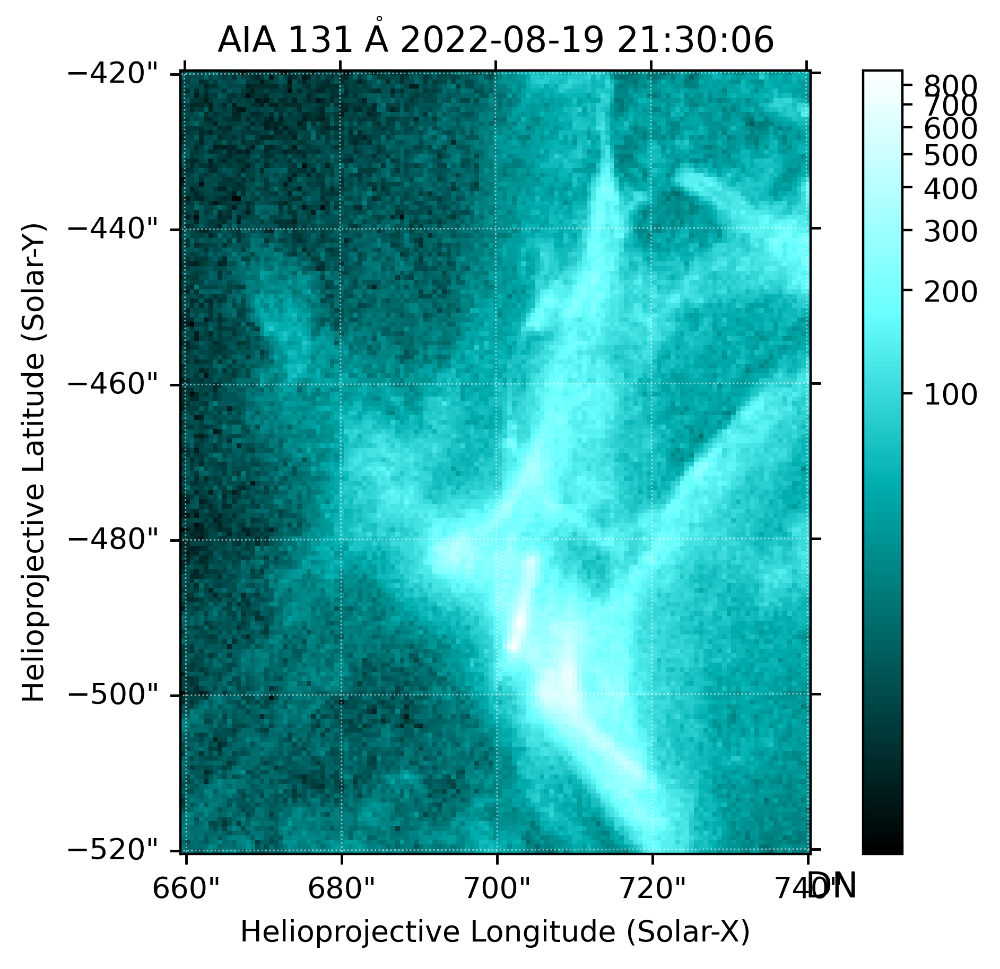

In [69]:
t_start = parse_time("2022-08-19T21:30:00")
search_results = Fido.search(
    a.Time(t_start, t_start + 12 * u.s),
    a.Instrument.aia,
    a.Wavelength(131 * u.angstrom),
)
files = Fido.fetch(search_results, max_conn=1)
m_131 = sunpy.map.Map(files[0])
blc = SkyCoord(660, -520, unit="arcsec", frame=m_131.coordinate_frame)
fov = {"width": 80 * u.arcsec, "height": 100 * u.arcsec}
m_131_cutout = m_131.submap(blc, **fov)
m_131_cutout.peek()

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

aia.lev1.1600A_2022_08_19T21_30_14.13Z.image_lev1.fits:   0%|          | 0.00/8.63M [00:00<?, ?B/s]

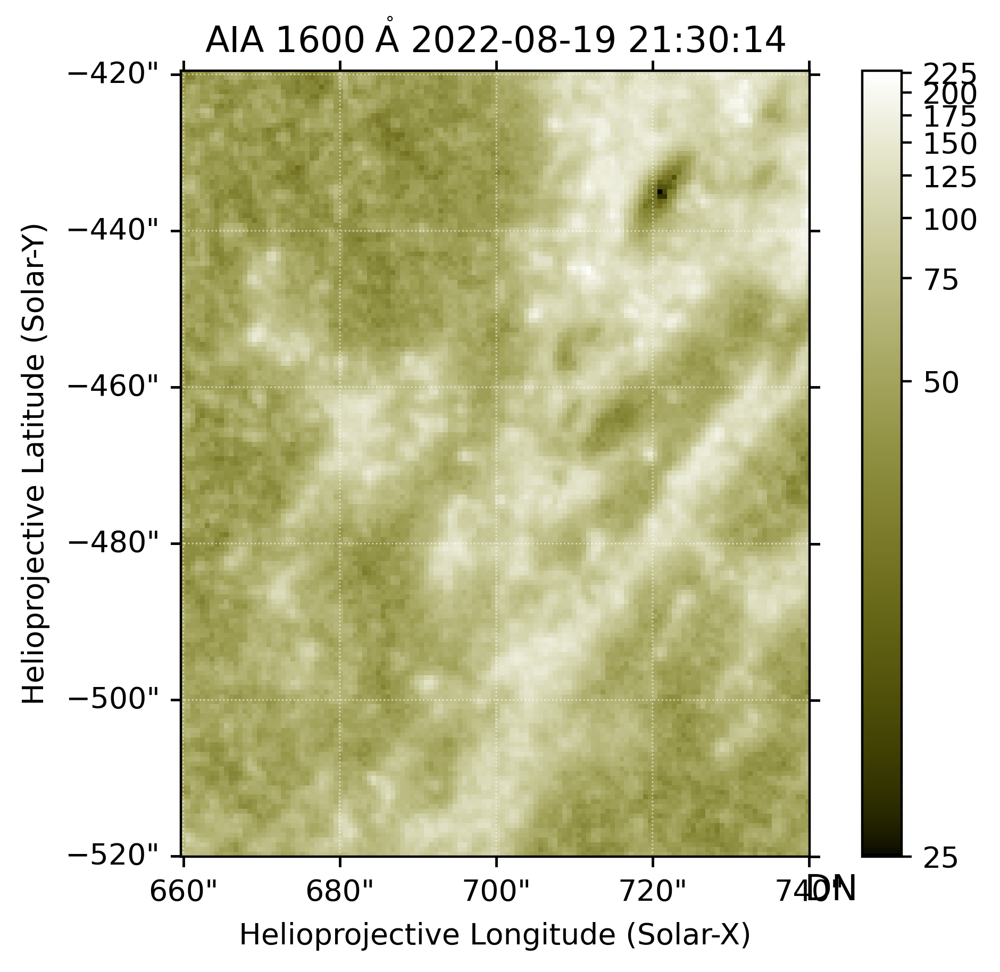

In [80]:
t_start = parse_time("2022-08-19T21:30:00")
search_results = Fido.search(
    a.Time(t_start, t_start + 30 * u.s),
    a.Instrument.aia,
    a.Wavelength(1600 * u.angstrom),
)
files = Fido.fetch(search_results, max_conn=1)
m_1600 = sunpy.map.Map(files[0])
blc = SkyCoord(660, -520, unit="arcsec", frame=m_1600.coordinate_frame)
fov = {"width": 80 * u.arcsec, "height": 100 * u.arcsec}
m_1600_cutout = m_1600.submap(blc, **fov)
m_1600_cutout.peek()

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

aia.lev1.171A_2022_08_19T21_30_09.35Z.image_lev1.fits:   0%|          | 0.00/11.7M [00:00<?, ?B/s]

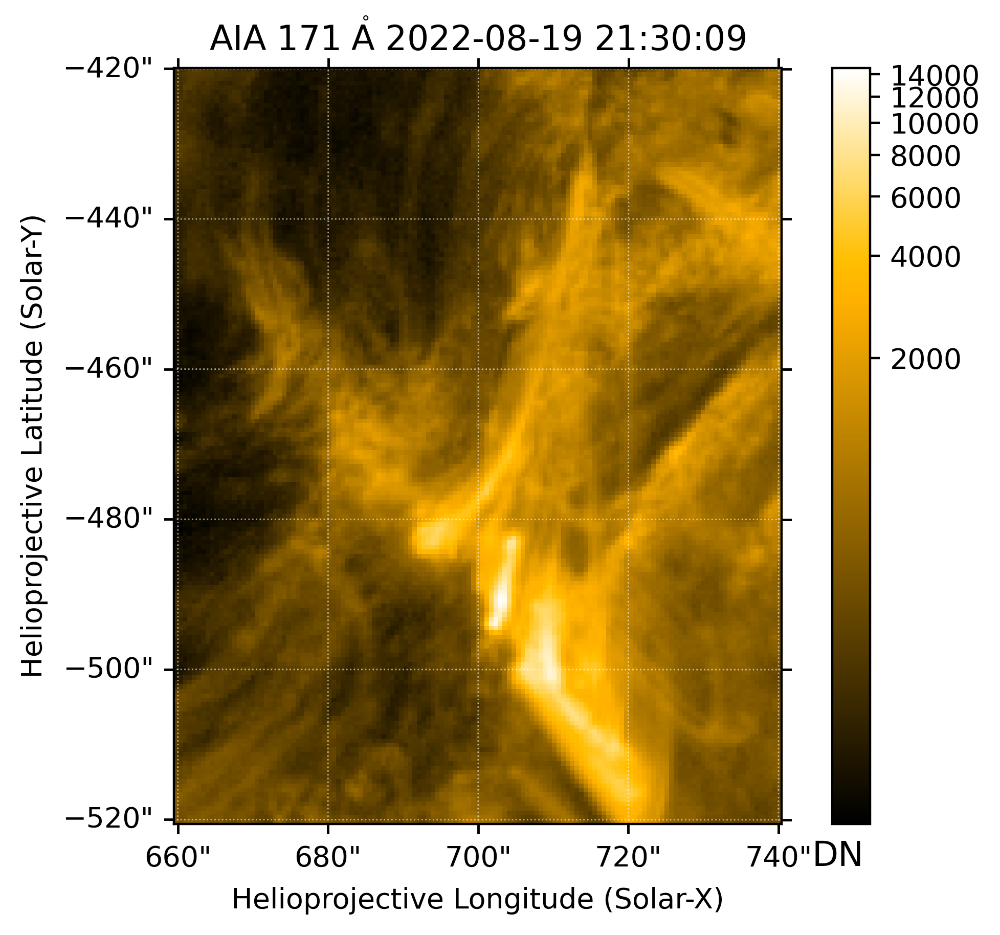

In [70]:
t_start = parse_time("2022-08-19T21:30:00")
search_results = Fido.search(
    a.Time(t_start, t_start + 12 * u.s),
    a.Instrument.aia,
    a.Wavelength(171 * u.angstrom),
)
files = Fido.fetch(search_results, max_conn=1)
m_171 = sunpy.map.Map(files[0])
blc = SkyCoord(660, -520, unit="arcsec", frame=m_171.coordinate_frame)
fov = {"width": 80 * u.arcsec, "height": 100 * u.arcsec}
m_171_cutout = m_171.submap(blc, **fov)
m_171_cutout.peek()